## Imports

In [1]:
# !pip install tensorflow-hub
# !pip install tensorflow
# !pip install scikit-image
# !pip install pydot
# !pip install graphviz

In [1]:
import os
import cv2
import copy
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import matplotlib.pyplot as mpplot

from tensorflow.keras import layers, losses
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Conv2D, concatenate

# Data Pipeline


In [2]:
# hyper-parameters

img_size = 224
miss_size = 200
img_channels = 3
missing_rate = 0.9
splitting_rate = 0.8
window_len = 200
csi_matrix_shape = (window_len, 208)

In [5]:
%cd /mnt/nas/Project_02/Datasets/Indoors
!ls


# images
raw_img = np.load('./camera_1/raw_img_(224_224).npy', allow_pickle=True, encoding="latin1") 


# CSI
csi_01 = np.load('./CSI/amp_01.npy', allow_pickle=True, encoding="latin1")
csi_02 = np.load('./CSI/amp_02.npy', allow_pickle=True, encoding="latin1")
csi_03 = np.load('./CSI/amp_03.npy', allow_pickle=True, encoding="latin1")
csi_04 = np.load('./CSI/amp_04.npy', allow_pickle=True, encoding="latin1")

csi_05 = np.load('./CSI/amp_05.npy', allow_pickle=True, encoding="latin1")
csi_06 = np.load('./CSI/amp_06.npy', allow_pickle=True, encoding="latin1")
csi_07 = np.load('./CSI/amp_07.npy', allow_pickle=True, encoding="latin1")
csi_08 = np.load('./CSI/amp_08.npy', allow_pickle=True, encoding="latin1")

csi_09 = np.load('./CSI/amp_09.npy', allow_pickle=True, encoding="latin1")



/mnt/nas/Datasets/Project_02/Indoors
230125_2  CSI  RSSI  camera_1  camera_2  camera_3  model.png  output.png  steps


In [6]:
# making CSI matrixes

def making_csi_matrix(csi):
 
    train_csi_set = []
    test_csi_set = []
    
    total_csi_num = csi.shape[0]
    time_stamp = int(splitting_rate*total_csi_num) 
    
    for count in range(int(0.5*window_len), time_stamp-int(0.5*window_len)): 
        train_csi_matrix = []
        for i in range(count-int(0.5*window_len), count+int(0.5*window_len)):
            train_csi_matrix.append(csi[i])
        train_csi_set.append(train_csi_matrix)
       

    for count in range(time_stamp + int(0.5*window_len), int(total_csi_num-window_len*0.5)):  
        test_csi_matrix = []
        for i in range(count-int(0.5*window_len), count+int(0.5*window_len)):
            test_csi_matrix.append(csi[i])
        test_csi_set.append(test_csi_matrix) 
    
    
    train_csi_set = np.array(train_csi_set)
    test_csi_set = np.array(test_csi_set)
    
    return train_csi_set, test_csi_set


train_csi_set_01, test_csi_set_01 =  making_csi_matrix(csi_01)
train_csi_set_02, test_csi_set_02 =  making_csi_matrix(csi_02)
train_csi_set_03, test_csi_set_03 =  making_csi_matrix(csi_03)
train_csi_set_04, test_csi_set_04 =  making_csi_matrix(csi_04)

In [7]:
# test 

print(train_csi_set_01.shape)

(9400, 200, 208)


In [8]:
def image_splitter(img_set):

    train_gd_img = []
    test_gd_img = []
    
    total_img_num = img_set.shape[0]
    time_stamp = int(splitting_rate*total_img_num) 

    for count in range(int(0.5*window_len), int(time_stamp-window_len*0.5)):  
        img_set[count] = cv2.cvtColor(img_set[count], cv2.COLOR_BGR2RGB)     
        train_gd_img.append(img_set[count]) 
       
    for count in range(time_stamp + int(0.5*window_len), int(total_img_num-window_len*0.5)): 
        img_set[count] = cv2.cvtColor(img_set[count], cv2.COLOR_BGR2RGB)     
        test_gd_img.append(img_set[count]) 
    
    
    train_gd_img = np.array(train_gd_img)
    test_gd_img = np.array(test_gd_img)
    
    return train_gd_img, test_gd_img


train_gd_img, test_gd_img = image_splitter(raw_img)

In [9]:
# test 
print(train_gd_img.shape)
print('num of train_img:', len(train_gd_img))
print('num of test_img:', len(test_gd_img))
print('type of train_img:', type(train_gd_img))

(9400, 224, 224, 3)
num of train_img: 9400
num of test_img: 2200
type of train_img: <class 'numpy.ndarray'>


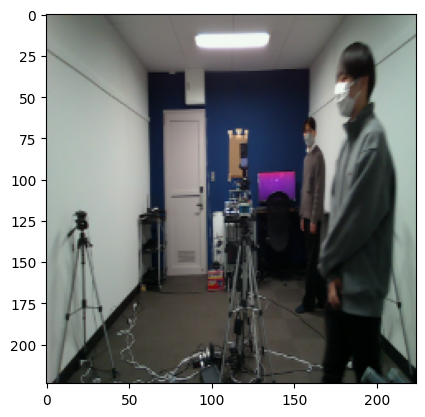

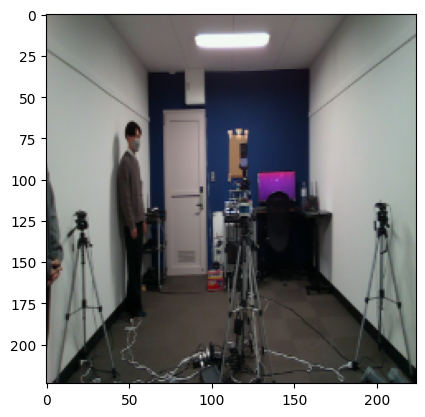

In [10]:
# test 

plt.imshow(train_gd_img[0])
plt.show()

plt.imshow(test_gd_img[0])
plt.show()

In [11]:
# # generate a missing part 

# def get_blocked_img(img_set):
    
#     blocked_img_set = []
    
#     for raw_image in img_set:
#         img = copy.deepcopy(raw_image)
#         img[:, :miss_size , :] = 0
#         blocked_img_set.append(img)

#     blocked_img_set = np.array(blocked_img_set)

#     return blocked_img_set

# train_blocked_img = get_blocked_img(train_gd_img)
# test_blocked_img = get_blocked_img(test_gd_img)

In [12]:
# # test 

# plt.imshow(train_blocked_img[0])
# plt.show()

# plt.imshow(test_blocked_img[0])
# plt.show()

# Model Utility

In [13]:
# Hyperparameters

transformer_layers = 8
num_heads = 4
projection_dim = 1000
transformer_units = [projection_dim * 2, projection_dim]
transformer_layers = 8
mlp_head_units = [2048, 1024]  
learning_rate = 0.001
batch_size = 32
num_epochs = 50


# Pretrained Model
MODEL_PATH = "https://tfhub.dev/sayakpaul/swin_base_patch4_window7_224_fe/1"

In [19]:
def mlp_1(x, hidden_units, dropout_rate):
    for units in hidden_units:
        x = layers.Dense(units, activation=tf.nn.gelu)(x)
        x = layers.Dropout(dropout_rate)(x)
    return x

def mlp_2(input):
    x = layers.BatchNormalization()(input)
    x = layers.Dense(2048, activation='relu')(x)
    x = layers.Dense(1024, activation='relu')(x)
    x = layers.Dense(784, activation='relu')(x)
    output = layers.Reshape([28, 28, 1])(x)
    return output

def Transformer(csi_1, csi_2, csi_3, csi_4, transformer_layers, num_heads, projection_dim, transformer_units):
    csi = layers.Concatenate()([csi_1, csi_2, csi_3, csi_4])
    encoded_input = layers.Dense(units=projection_dim)(csi)

    for i in range(transformer_layers):
        x1 = layers.LayerNormalization(epsilon=1e-6)(encoded_input)
        attention_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=projection_dim, dropout=0.1)(x1, x1)
        x2 = layers.Add()([attention_output, encoded_input])
        x3 = layers.LayerNormalization(epsilon=1e-6)(x2)
        x3 = mlp_1(x3, hidden_units=transformer_units, dropout_rate=0.1)
        representation = layers.Add()([x3, x2])

    representation = layers.LayerNormalization(epsilon=1e-6)(representation)
    representation = layers.Flatten()(representation)
    representation = layers.Dropout(0.5)(representation)
    output = mlp_2(representation)
    return output

def Imager(csi_info):
    x = layers.Conv2D(32, 3, activation='relu', padding="same")(csi_info)
    x = layers.UpSampling2D(size=(2, 2))(x)
    
    x = layers.Conv2D(64, 3, activation='relu', padding="same")(x)
    x = layers.UpSampling2D(size=(2, 2))(x)
                                        
    x = layers.Conv2D(128, 3, activation='relu', padding="same")(x)
    x = layers.UpSampling2D(size=(2, 2))(x)
    
    outputs = layers.Conv2D(3, 3, activation='relu', padding="same")(x)
    return outputs


# Define the model creation function
def CSI_Imaging(model_url, transformer_layers, num_heads, projection_dim, transformer_units):
    # input 
    csi_1 = Input(shape=csi_matrix_shape)
    csi_2 = Input(shape=csi_matrix_shape)
    csi_3 = Input(shape=csi_matrix_shape)
    csi_4 = Input(shape=csi_matrix_shape)
    
    # encoding
    csi_info = Transformer(csi_1, csi_2, csi_3, csi_4, transformer_layers, num_heads, projection_dim, transformer_units)

    # decoding
    outputs = Imager(csi_info)

    return Model(inputs=[csi_1, csi_2, csi_3, csi_4], outputs=outputs)


In [21]:
model_url = MODEL_PATH
model = CSI_Imaging(model_url, transformer_layers, num_heads, projection_dim, transformer_units)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 200, 208)]           0         []                            
                                                                                                  
 input_2 (InputLayer)        [(None, 200, 208)]           0         []                            
                                                                                                  
 input_3 (InputLayer)        [(None, 200, 208)]           0         []                            
                                                                                                  
 input_4 (InputLayer)        [(None, 200, 208)]           0         []                            
                                                                                              

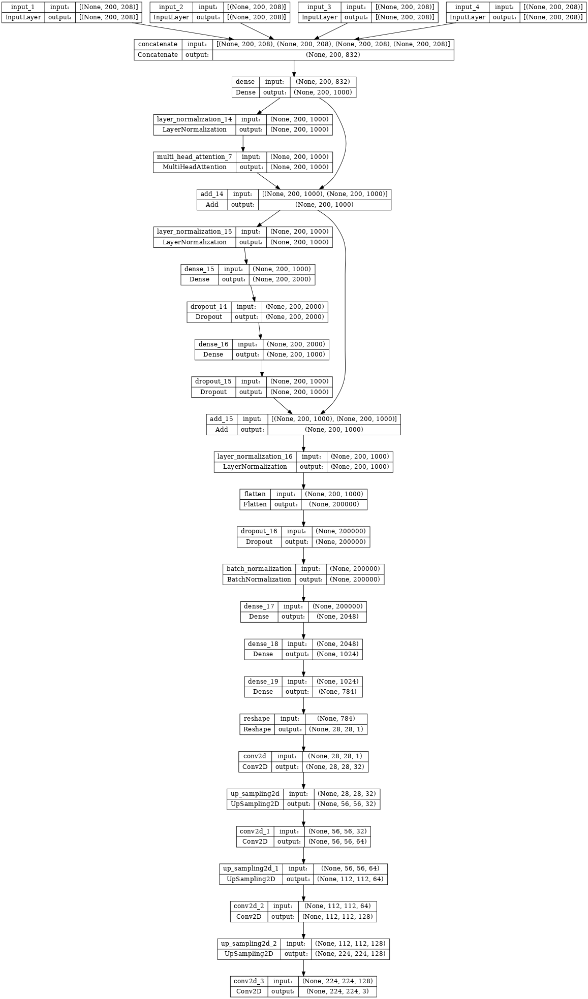

In [22]:
# plot the model
tf.keras.utils.plot_model(model, show_shapes=True, dpi=64)

In [23]:
!nvidia-smi

Tue Jan  9 07:34:25 2024       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.74       Driver Version: 470.74       CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA RTX A6000    On   | 00000000:86:00.0 Off |                  Off |
| 30%   33C    P2    71W / 300W |  47149MiB / 48685MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Training & Validation

In [24]:
from tensorflow.keras.callbacks import LearningRateScheduler
callback = LearningRateScheduler(lambda ep: float(1e-3 * 0.975**ep))
model.compile(optimizer='adam', loss=losses.MeanSquaredError(),)

history = model.fit(
        x=[train_csi_set_01, train_csi_set_02, train_csi_set_03, train_csi_set_04],
        y=train_gd_img,
        batch_size=batch_size,
        epochs=num_epochs,
        validation_split=0.1,
        callbacks=[callback])

Epoch 1/50
265/265 [==============================] - 62s 159ms/step - loss: 0.0184 - val_loss: 0.0096 - lr: 0.0010
Epoch 2/50
265/265 [==============================] - 38s 142ms/step - loss: 0.0075 - val_loss: 0.0066 - lr: 9.7500e-04
Epoch 3/50
265/265 [==============================] - 40s 149ms/step - loss: 0.0057 - val_loss: 0.0059 - lr: 9.5062e-04
Epoch 4/50
265/265 [==============================] - 39s 147ms/step - loss: 0.0048 - val_loss: 0.0056 - lr: 9.2686e-04
Epoch 5/50
265/265 [==============================] - 39s 146ms/step - loss: 0.0043 - val_loss: 0.0050 - lr: 9.0369e-04
Epoch 6/50
265/265 [==============================] - 39s 146ms/step - loss: 0.0040 - val_loss: 0.0049 - lr: 8.8110e-04
Epoch 7/50
265/265 [==============================] - 38s 144ms/step - loss: 0.0037 - val_loss: 0.0043 - lr: 8.5907e-04
Epoch 8/50
265/265 [==============================] - 38s 145ms/step - loss: 0.0035 - val_loss: 0.0048 - lr: 8.3759e-04
Epoch 9/50
265/265 [========================

# Predictions

In [25]:
evaluations = model.evaluate([test_csi_set_01, test_csi_set_02, test_csi_set_03, test_csi_set_04], test_gd_img, verbose=0)
print("[val_loss, val_acc]", evaluations)
recovered_img = model.predict([test_csi_set_01, test_csi_set_02, test_csi_set_03, test_csi_set_04])

[val_loss, val_acc] 0.002794938627630472
69/69 [==============================] - 4s 50ms/step


In [26]:
print(recovered_img[0].shape)
print(test_gd_img[0].shape[:2])

(224, 224, 3)
(224, 224)


In [27]:
# SSIM
from skimage.metrics import structural_similarity as ssim

# Assuming test_gd_img and recovered_img are lists or arrays of images
# and that they have the same length
mean_ssim = 0
num_images = len(test_gd_img)

for i in range(num_images):
    ssim_value = ssim(test_gd_img[i], recovered_img[i], multichannel=True, win_size=11, channel_axis=2, data_range=1)
    mean_ssim += ssim_value

# Calculate the mean SSIM over all image pairs
mean_ssim /= num_images

print('Mean SSIM:', mean_ssim)



Mean SSIM: 0.8431556882912462


In [29]:
# PSNR

import skimage.measure
Mean_PSNR = 0

for i in range(num_images):
    Mean_PSNR += skimage.metrics.peak_signal_noise_ratio(test_gd_img[i], recovered_img[i], data_range=1.0)
    
Mean_PSNR = Mean_PSNR/num_images
print('Mean_PSNR is', Mean_PSNR)


Mean_PSNR is 26.23071241962175


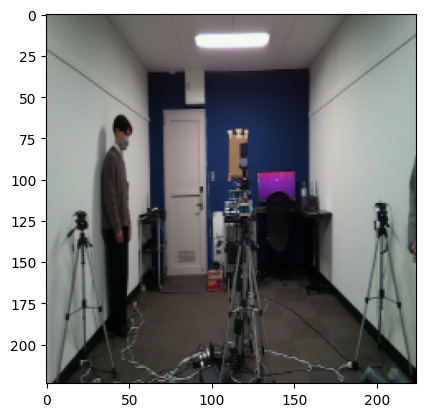

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


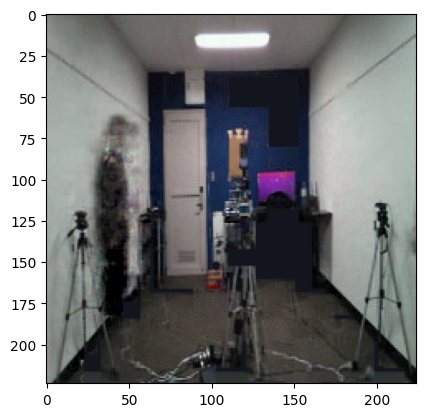

SSIM: 0.8683882
PSNR: 26.357695771074965
**************************************************************************************


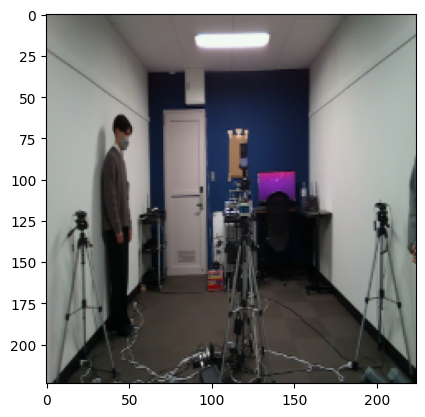

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


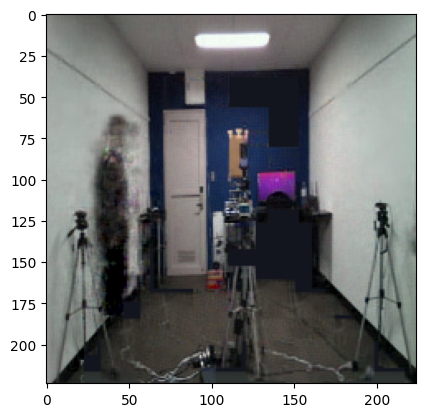

SSIM: 0.8662197
PSNR: 26.218111980498403
**************************************************************************************


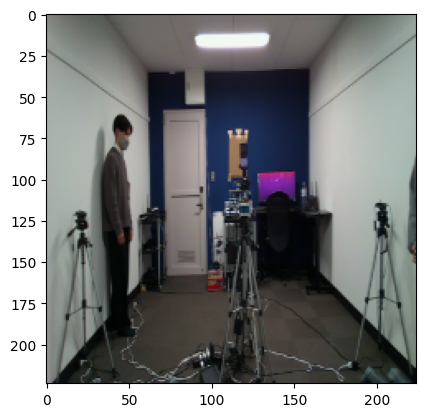

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


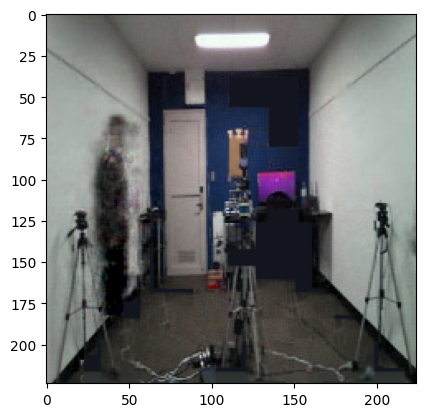

SSIM: 0.8638373
PSNR: 26.130334183276158
**************************************************************************************


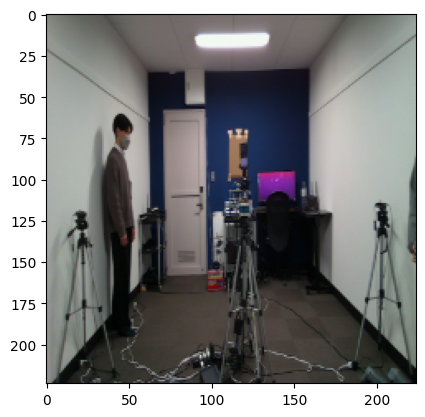

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


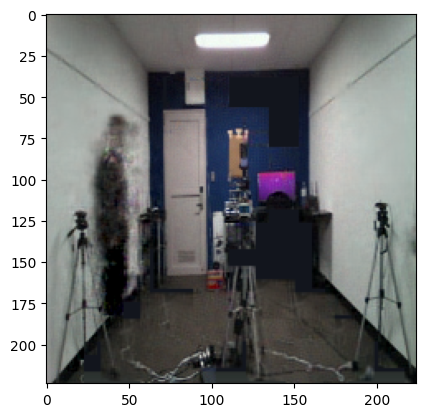

SSIM: 0.85277814
PSNR: 25.07583643971415
**************************************************************************************


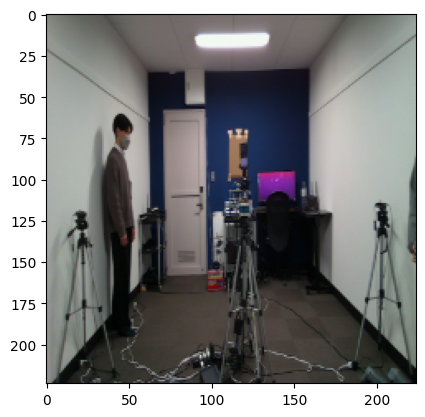

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


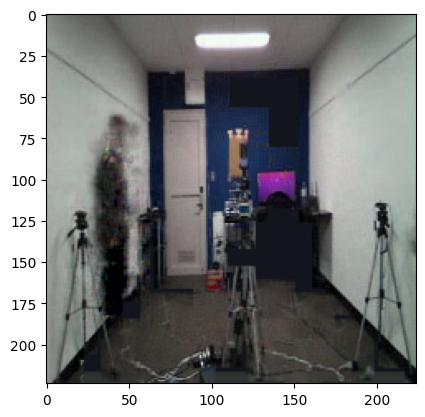

SSIM: 0.853045
PSNR: 25.12629998732749
**************************************************************************************


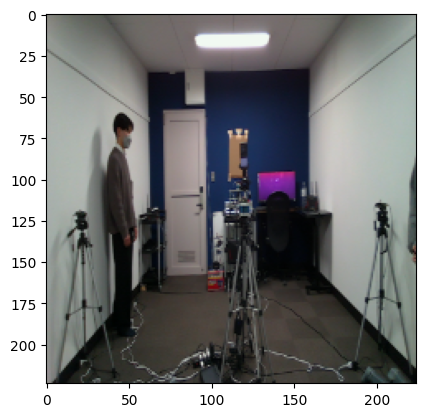

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


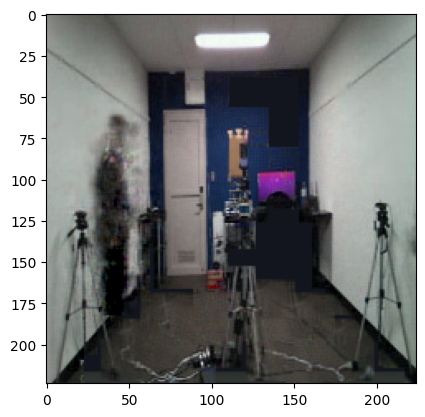

SSIM: 0.8443307
PSNR: 24.383771906629423
**************************************************************************************


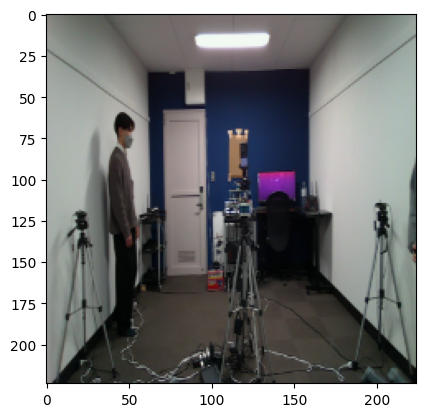

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


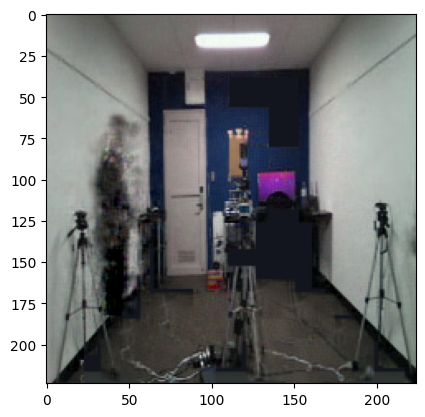

SSIM: 0.83342177
PSNR: 23.472572567112394
**************************************************************************************


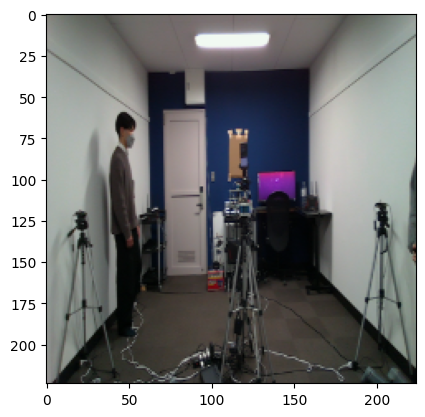

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


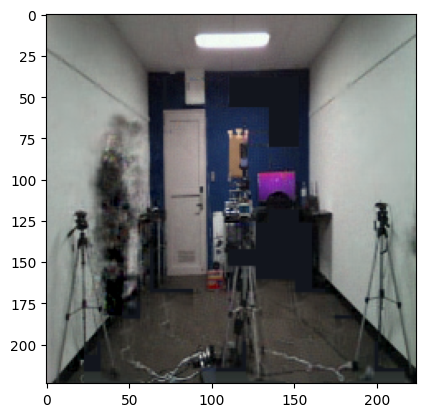

SSIM: 0.82441026
PSNR: 22.978933037109126
**************************************************************************************


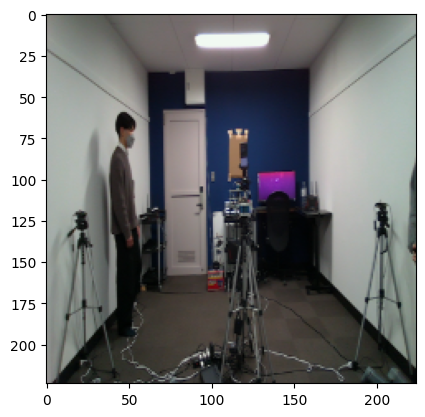

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


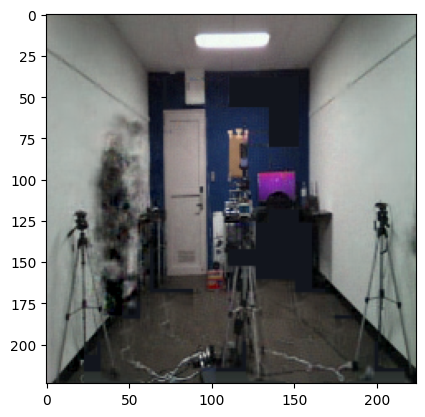

SSIM: 0.8223557
PSNR: 23.16799019012571
**************************************************************************************


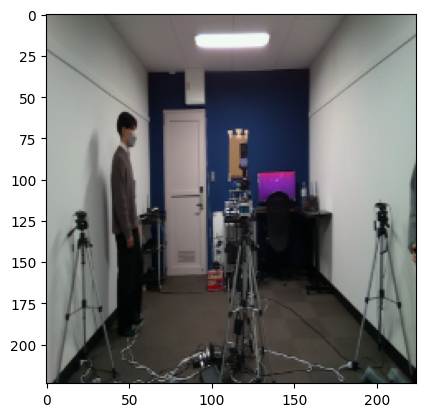

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


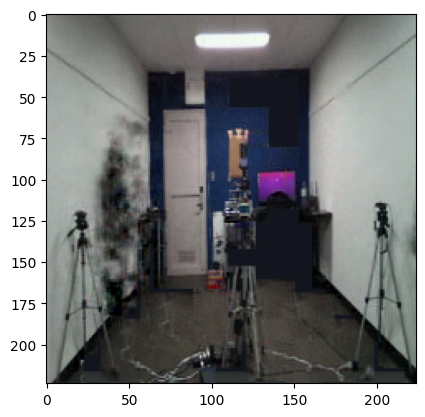

SSIM: 0.81784564
PSNR: 23.116142652283948
**************************************************************************************


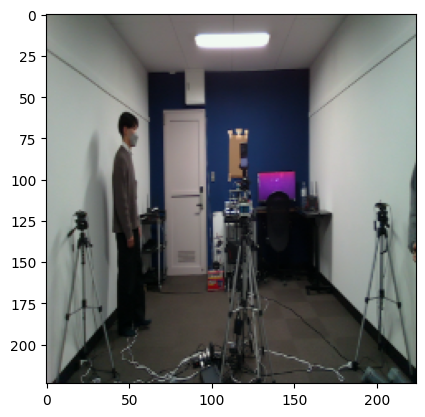

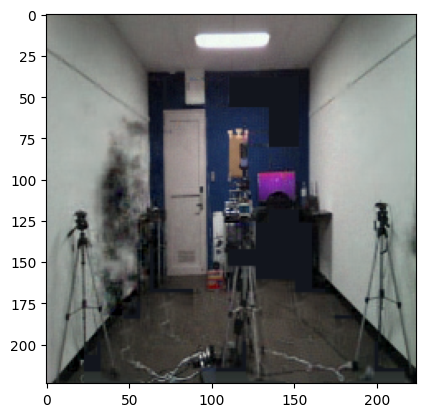

SSIM: 0.816619
PSNR: 23.323004544864965
**************************************************************************************


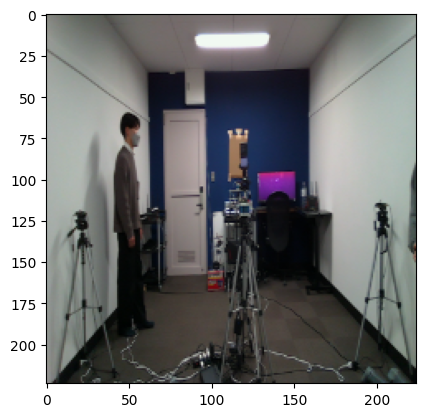

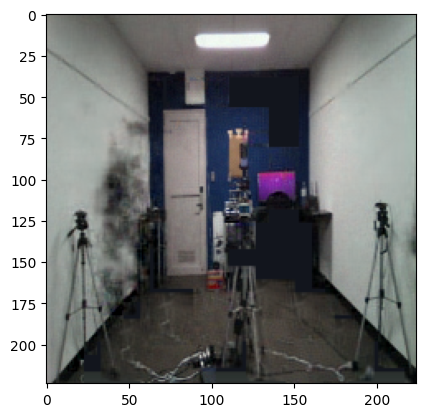

SSIM: 0.815326
PSNR: 23.29896545194058
**************************************************************************************


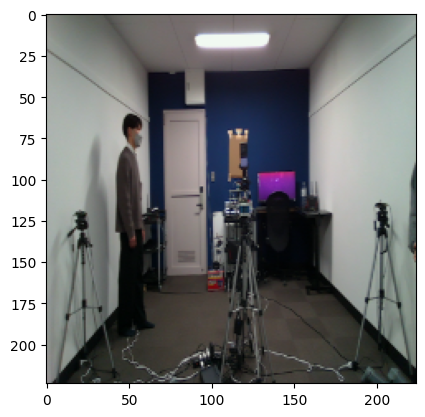

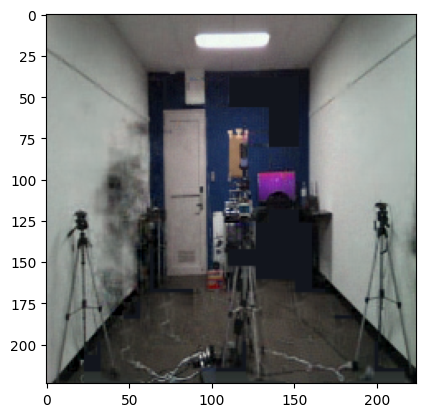

SSIM: 0.81188774
PSNR: 23.164320357218813
**************************************************************************************


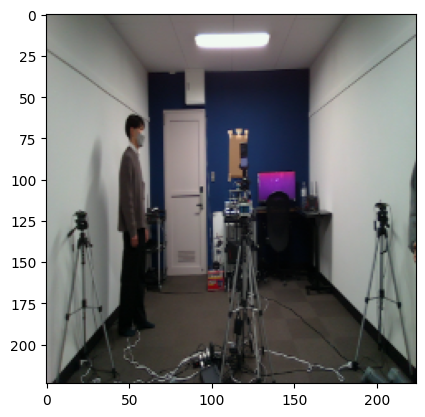

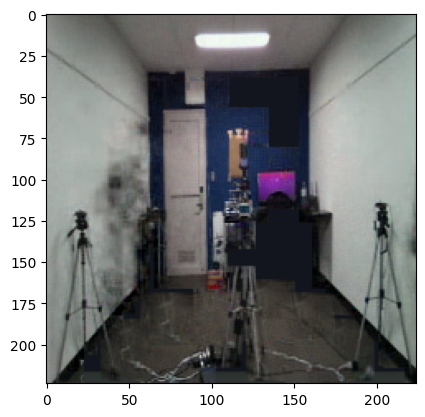

SSIM: 0.8092072
PSNR: 23.126100635056943
**************************************************************************************


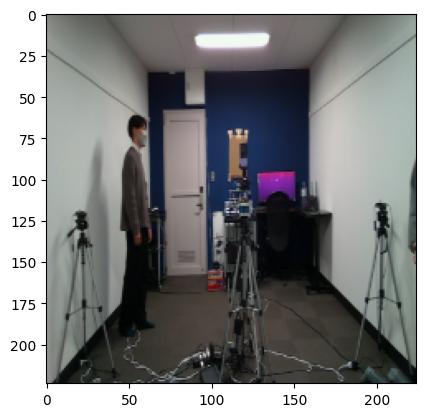

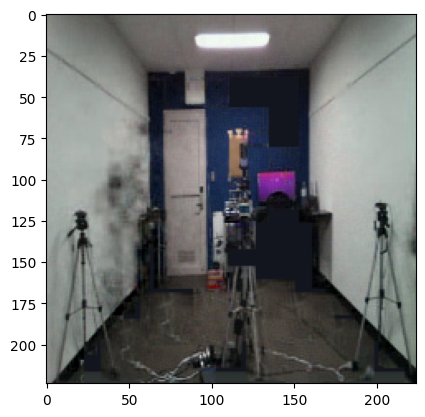

SSIM: 0.8092985
PSNR: 23.209651997675344
**************************************************************************************


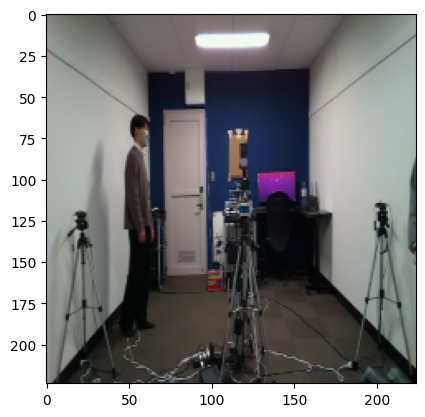

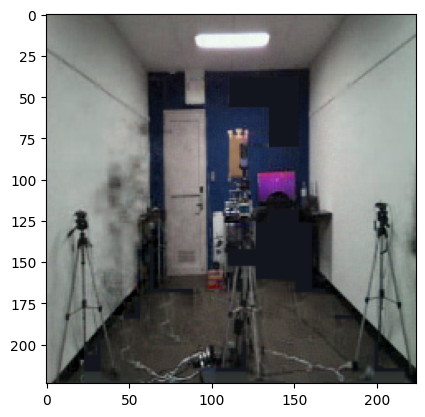

SSIM: 0.80850124
PSNR: 23.26751925310511
**************************************************************************************


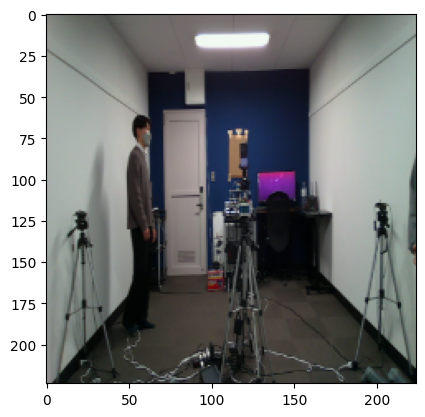

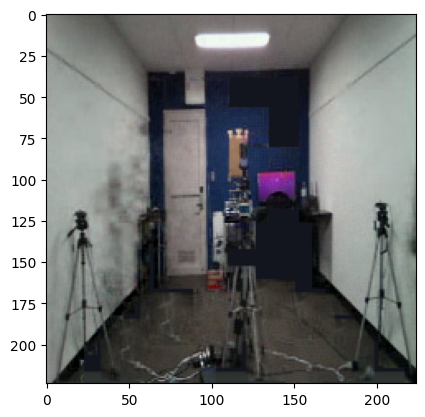

SSIM: 0.81173867
PSNR: 23.59612082528438
**************************************************************************************


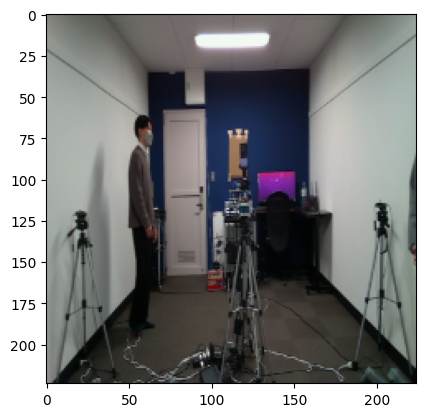

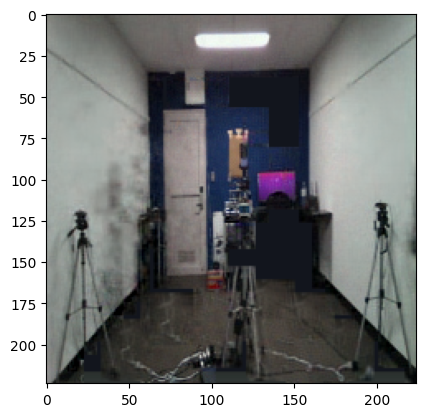

SSIM: 0.814109
PSNR: 23.749646990574178
**************************************************************************************


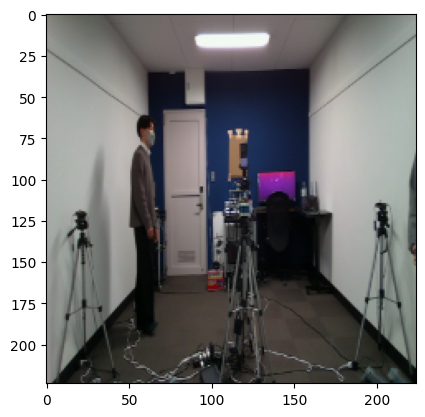

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


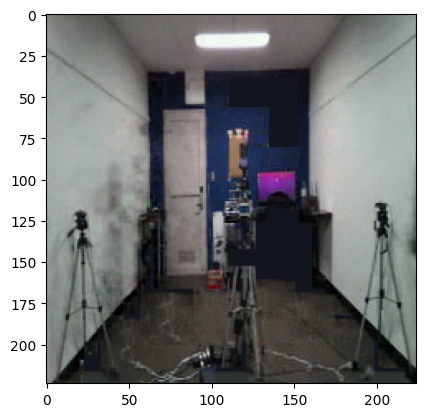

SSIM: 0.81572723
PSNR: 23.983858778216295
**************************************************************************************


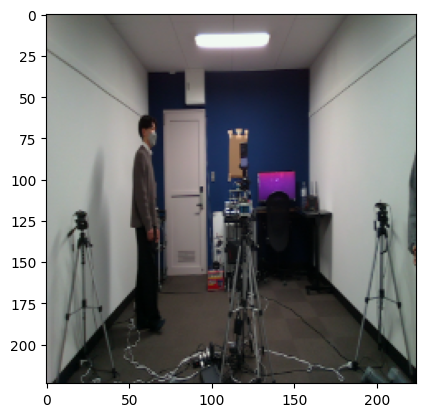

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


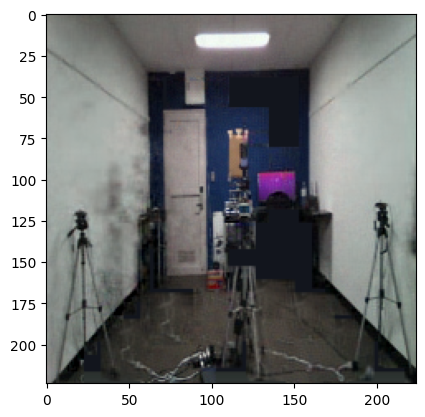

SSIM: 0.8162441
PSNR: 24.28139377598868
**************************************************************************************


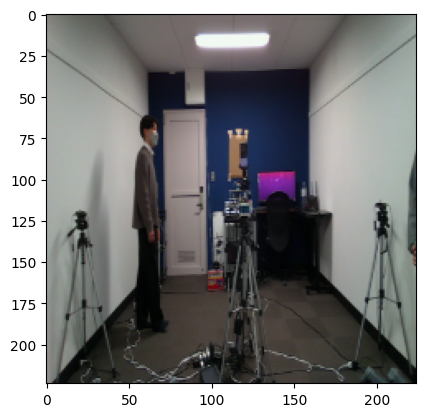

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


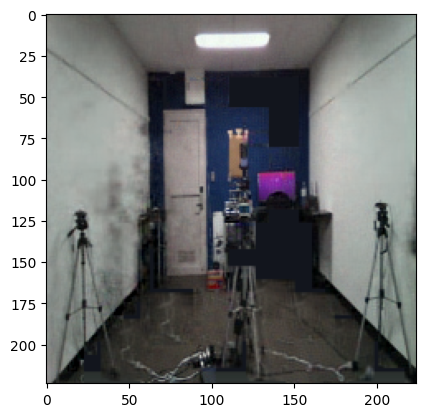

SSIM: 0.8165193
PSNR: 24.6291677056115
**************************************************************************************


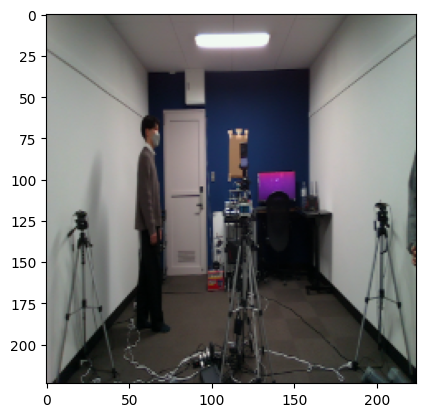

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


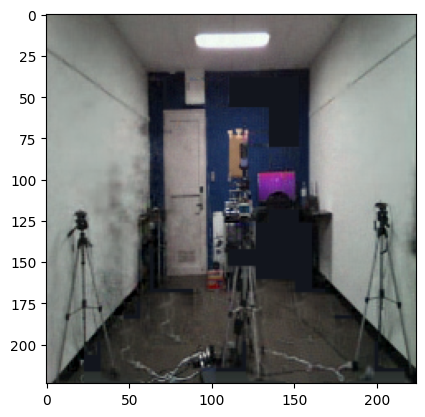

SSIM: 0.8168929
PSNR: 24.970520762667334
**************************************************************************************


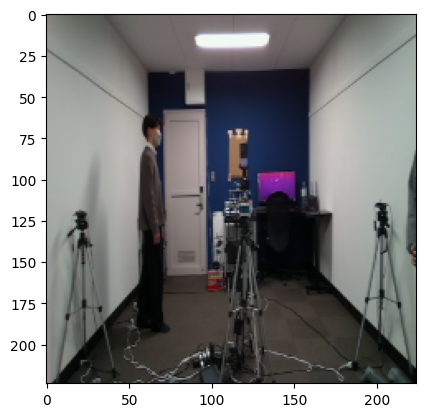

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


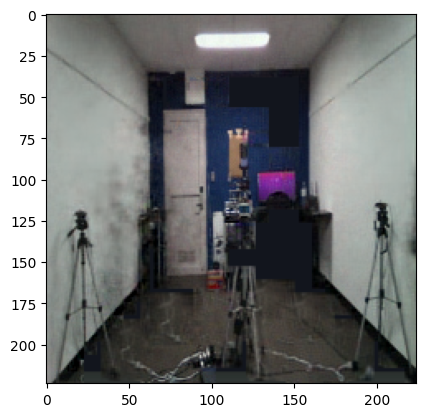

SSIM: 0.8185374
PSNR: 25.232678924860828
**************************************************************************************


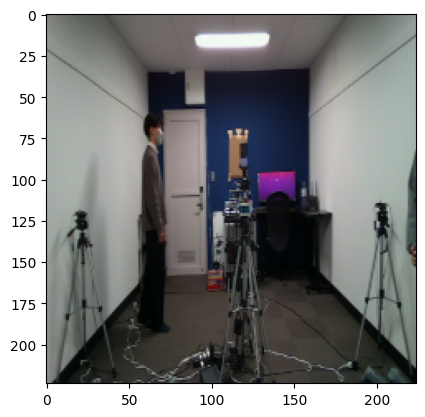

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


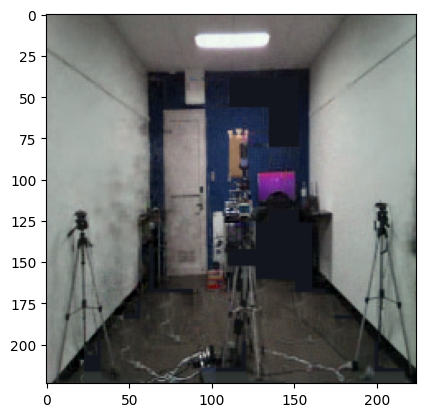

SSIM: 0.82176787
PSNR: 25.49962385836197
**************************************************************************************


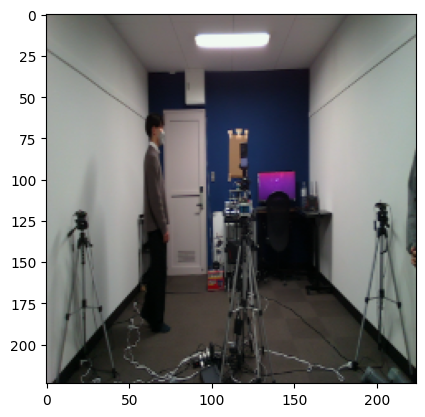

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


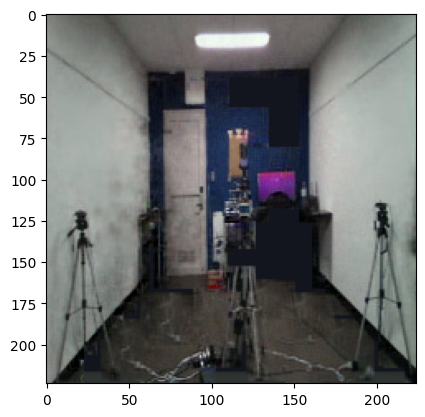

SSIM: 0.8276574
PSNR: 25.84369805202472
**************************************************************************************


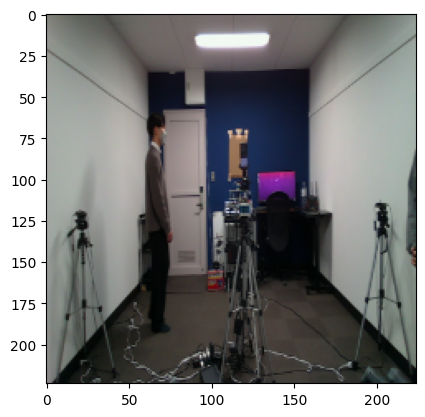

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


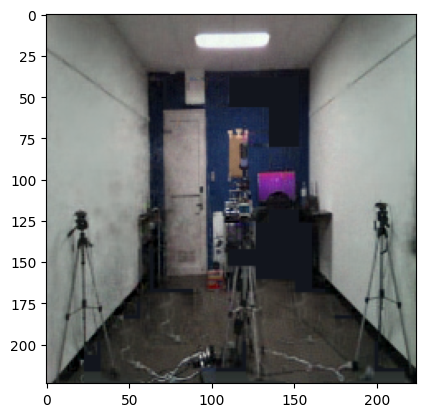

SSIM: 0.8339284
PSNR: 26.240606316312327
**************************************************************************************


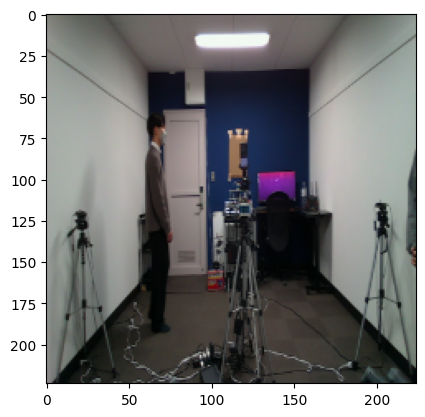

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


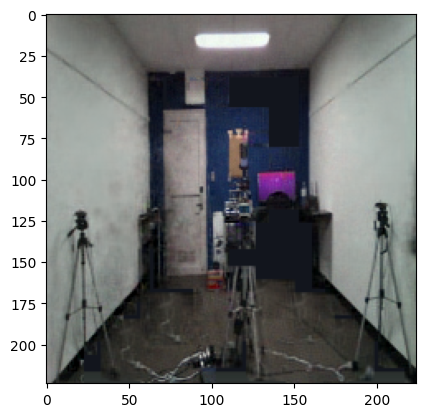

SSIM: 0.837177
PSNR: 26.354305063396396
**************************************************************************************


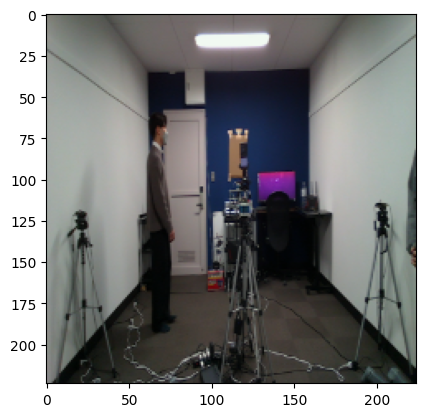

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


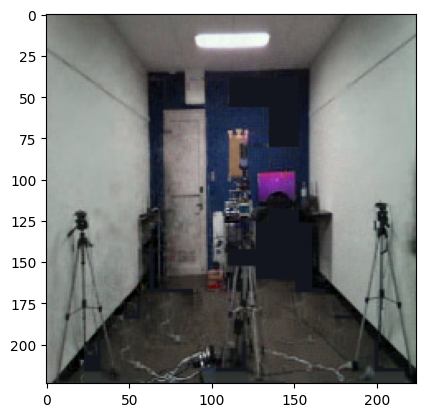

SSIM: 0.8392188
PSNR: 26.515672568789764
**************************************************************************************


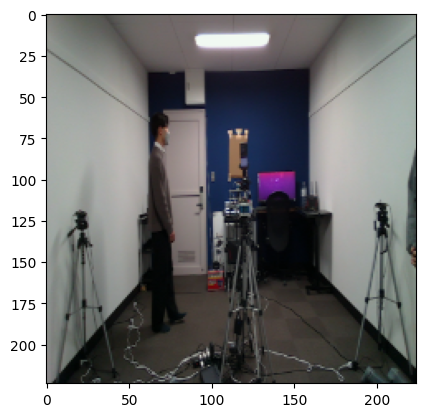

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


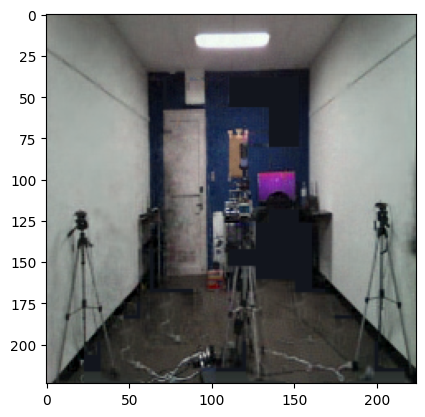

SSIM: 0.8423162
PSNR: 26.594939201184054
**************************************************************************************


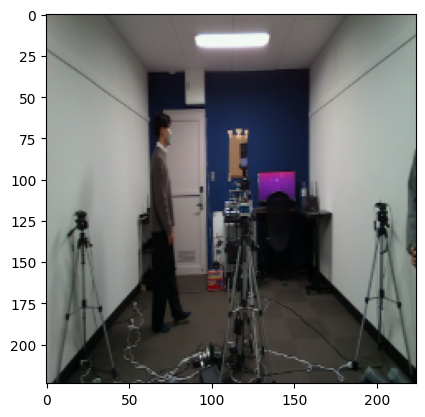

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


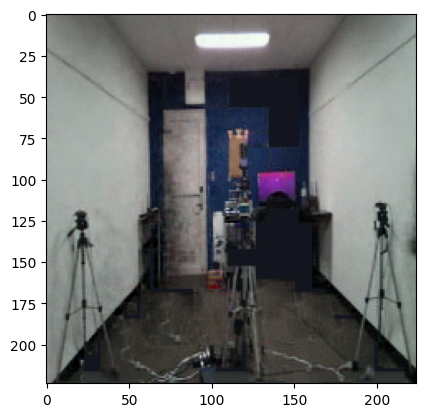

SSIM: 0.84501934
PSNR: 26.61639827578069
**************************************************************************************


In [33]:
for i in range(820, 850):

    plt.imshow(test_gd_img[i])
    plt.show()

    plt.imshow(recovered_img[i])
    plt.show()
    
    print("SSIM:", ssim(test_gd_img[i], recovered_img[i], multichannel=True, win_size=11, channel_axis=2, data_range=1))
    print("PSNR:", skimage.metrics.peak_signal_noise_ratio(test_gd_img[i], recovered_img[i], data_range=1.0))
    
    print("**************************************************************************************")

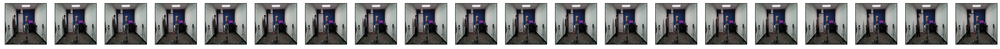

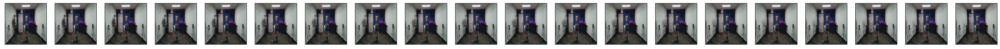

In [34]:
n = 20

plt.figure(figsize=(40, 4))
for i in range(n):
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(tf.squeeze(test_gd_img[i]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.show()


plt.figure(figsize=(40, 4))
for i in range(n):
    # ax = plt.subplot(2, n, i + 1)
    # plt.imshow(tf.squeeze(test_blocked_img[i]))
    # plt.gray()
    # ax.get_xaxis().set_visible(False)
    # ax.get_yaxis().set_visible(False)
 
    bx = plt.subplot(2, n, i + n + 1)
    plt.imshow(tf.squeeze(recovered_img[i]))
    plt.gray()
    bx.get_xaxis().set_visible(False)
    bx.get_yaxis().set_visible(False)
plt.show()


In [ ]:
# saving and loading model

In [35]:
%cd /mnt/nas/Project_02/Pretrained_model
!ls

model.save('c1_indoor_imaging.h5')

/mnt/nas/Project_02/Pretrained_model


/home/cheng/.local/lib/python3.8/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


NameError: name 'load_model' is not defined

69/69 [==============================] - 3s 45ms/step


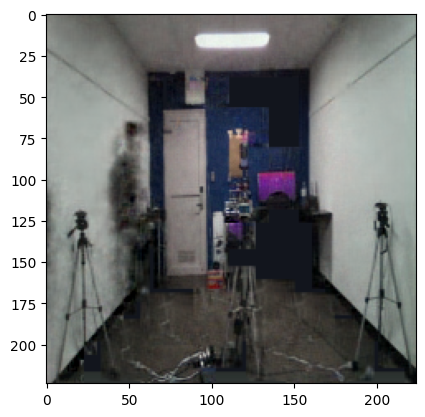

In [36]:
from tensorflow.keras.models import load_model
loaded_model = load_model('c1_indoor_imaging.h5')

test_img = model.predict([test_csi_set_01, test_csi_set_02, test_csi_set_03, test_csi_set_04])

plt.imshow(test_img[0])
plt.show()